# Open observations easily
- predefined locations for netcdf files
- easily accessible with catalogs in yaml files
  - link readme as metadata
- select: resolution or WOA variable name
- tab completion of available files for cat[&Tab&]
- example plots
- relies on intake: https://github.com/intake/intake and https://github.com/intake/intake-xarray/
- very advanced for CESM: https://github.com/NCAR/intake-esm 
- why https://www.anaconda.com/intake-taking-the-pain-out-of-data-access/

In [14]:
import xarray as xr
import matplotlib.pyplot as plt
import hvplot.xarray
import geoviews as gv
import pandas as pd

all observational datasets are linked in a yaml file as a catalog

In [3]:
!cat ../intake/mBGC_obs.yml | head -20

# naming: cmorized varname.product_name.time.space.misc
# if category not availbale, then leave out
plugins:
  source:
      - module: intake_xarray
sources:
  pco2_Takahashi:
    driver: netcdf
    description: Takahashi climatology on different grids
    parameters:
      s_res:
        description: 'spatial resolution'
        type: str
        default: 'GR15'
        allowed: ['GR15', '1deg','R2B6']
    args:
      urlpath: '/work/mh0727/data/pCO2/pco2_taka_{{s_res}}.nc'
      decode_times: False

  iron_Mahowald:


all observational datasets linked in a catalog have tap-completion

In [29]:
import intake
cat = intake.open_catalog('../intake/mBGC_obs.yml')
list(cat)

['pco2_Takahashi',
 'iron_Mahowald',
 'iron_Albani2016',
 'fgco2_SOMFFN',
 'fgco2_UEASI',
 'fgco2_JMA-MLR',
 'fgco2_JenaMLS',
 'SOCOM_biomes',
 'SOCOM_all_products',
 'zmld.IFREMER',
 'zmld.Levitus',
 'WOA13']

cat.obs.describe() shows the allowed parameters 

In [16]:
cat.WOA13.describe()

{'container': 'xarray',
 'description': 'World Ocean Atlas',
 'direct_access': 'forbid',
 'user_parameters': [{'name': 't_res',
   'description': 'temporal resolution',
   'type': 'str',
   'allowed': ['annual', 'month', 'seasonal'],
   'default': 'annual'},
  {'name': 's_res',
   'description': 'spatial resolution',
   'type': 'str',
   'allowed': ['GR15', '1deg', 'R2B6L64', 'TP04'],
   'default': 'GR15'},
  {'name': 'var',
   'description': 'variable name',
   'type': 'str',
   'allowed': ['nitrate',
    'dissolved_oxygen',
    'apparent_oxygen_utilization',
    'phosphate',
    'salinity',
    'silicate',
    'temperature'],
   'default': 'nitrate'}]}

cat.obs.describe_open() shows the underlying default link

In [17]:
cat.fgco2_JenaMLS.describe_open()

{'plugin': 'netcdf',
 'description': '',
 'direct_access': 'forbid',
 'metadata': {'readme': '/work/mh0727/data/SOCOM/gridded_data/Jena-MLS/README'},
 'args': {'metadata': {'readme': '/work/mh0727/data/SOCOM/gridded_data/Jena-MLS/README',
   'catalog_dir': '/mnt/lustre01/pf/zmaw/m300524/pymistral/notebooks/../intake/'},
  'urlpath': '/work/mh0727/data/SOCOM/gridded_data/Jena-MLS/oc_v1.5_daily.nc',
  'chunks': {'time': 12}}}

cat.obs.describe() shows the parameter possibilities

In [18]:
cat.fgco2_JenaMLS.describe()

{'container': 'xarray',
 'description': '',
 'direct_access': 'forbid',
 'user_parameters': [{'name': 'version',
   'description': 'version',
   'type': 'str',
   'allowed': ['v1.4', 'v1.5_daily', 'v1.5_pCO2_daily'],
   'default': 'v1.5_daily'}]}

cat.obs.discover() shows the metadata (xarray attrs, ncdump -h)

In [19]:
cat.fgco2_JenaMLS.discover()

{'datashape': None,
 'dtype': None,
 'shape': None,
 'npartitions': None,
 'metadata': {'readme': '/work/mh0727/data/SOCOM/gridded_data/Jena-MLS/README',
  'catalog_dir': '/mnt/lustre01/pf/zmaw/m300524/pymistral/notebooks/../intake/',
  'dims': {'lat': 48,
   'lon': 72,
   'mtime': 12784,
   'mtime0': 100,
   'nv': 2,
   'proc': 23,
   'rt': 3,
   'spec': 1,
   'time': 14975},
  'data_vars': {'lon_bounds': ['lon'],
   'lat_bounds': ['lat'],
   'time_bounds': ['time'],
   'dt': ['time'],
   'year': ['time'],
   'lproc': ['proc'],
   'lrt': ['rt'],
   'lspec': ['spec'],
   'dxyp': ['lon', 'lat'],
   'area': ['lon', 'lat', 'rt'],
   'myear': ['mtime'],
   'tmask': ['time'],
   'co2flux_land': ['lon', 'lat', 'mtime'],
   'co2flux_ocean': ['lon', 'lat', 'mtime'],
   'co2flux_subt': ['lon', 'lat', 'mtime'],
   'co2flux_excl': ['lon', 'lat', 'mtime'],
   'taper': ['time']},
  'coords': ('lon', 'lat', 'time', 'proc', 'rt', 'spec', 'mtime'),
  'title': 'Jena CarboScope results',
  'history': 'I

# predefined plots

In [20]:
cat.iron_Mahowald.plots

['monthly_climatology']

In [22]:
cat.iron_Mahowald(s_res='TP04').plot.monthly_climatology() #* gv.feature.coastline

:DynamicMap   [time]
   :Polygons   [lon,lat]   (DUST)

In [17]:
cat.fgco2_SOMFFN.plots

['fgco2_over_time', 'fgco2_timeseries_location', 'fgco2_timeseries_latitude']

In [23]:
cat.fgco2_SOMFFN.plot.fgco2_timeseries_latitude()

/work/mh0727/m300524/anaconda3/envs/my_jupyter/lib/python3.6/site-packages/matplotlib/contour.py:1557: UserWarning: Warning: converting a masked element to nan.
  self.zmax = float(z.max())
/work/mh0727/m300524/anaconda3/envs/my_jupyter/lib/python3.6/site-packages/matplotlib/contour.py:1558: UserWarning: Warning: converting a masked element to nan.
  self.zmin = float(z.min())
/work/mh0727/m300524/anaconda3/envs/my_jupyter/lib/python3.6/site-packages/matplotlib/contour.py:1203: RuntimeWarning: invalid value encountered in less
  under = np.nonzero(lev < self.zmin)[0]
/work/mh0727/m300524/anaconda3/envs/my_jupyter/lib/python3.6/site-packages/matplotlib/contour.py:1205: RuntimeWarning: invalid value encountered in greater
  over = np.nonzero(lev > self.zmax)[0]


:DynamicMap   [lat]
   :Polygons   [lon,time]   (fgco2)

In [24]:
cat.fgco2_SOMFFN.plot.fgco2_over_time()

:DynamicMap   [time]
   :Polygons   [lon,lat]   (fgco2)

In [25]:
cat.SOCOM_all_products(biome=17).plot.fgco2_over_time(xlim=(1030,1320),ylim=(320,390))

:Curve   [taxis]   (meanf)

In [26]:
cat.SOCOM_all_products(biome=17).plot.spco2_over_time(xlim=(1030,1320))

:Curve   [taxis]   (fluxf)

In [27]:
cat.fgco2_SOMFFN.plot.fgco2_timeseries_location()

:DynamicMap   [lon,lat]
   :Curve   [time]   (fgco2)

In [28]:
cat.WOA13(var='silicate',s_res='1deg',t_res='seasonal').plot.climatology(levels=50)

:DynamicMap   [time,depth]
   :Polygons   [lon,lat]   (i_an)

# WOA13
select spatial resolution, temporal resolution and variable name

In [25]:
cat.WOA13.describe()

{'container': 'xarray',
 'description': 'World Ocean Atlas',
 'direct_access': 'forbid',
 'user_parameters': [{'name': 't_res',
   'description': 'temporal resolution',
   'type': 'str',
   'allowed': ['annual', 'month', 'seasonal'],
   'default': 'annual'},
  {'name': 's_res',
   'description': 'spatial resolution',
   'type': 'str',
   'allowed': ['GR15', '1deg', 'R2B6L64', 'TP04'],
   'default': 'GR15'},
  {'name': 'var',
   'description': 'variable name',
   'type': 'str',
   'allowed': ['nitrate',
    'dissolved_oxygen',
    'apparent_oxygen_utilization',
    'phosphate',
    'salinity',
    'silicate',
    'temperature'],
   'default': 'nitrate'}]}

nitrate at depth=300 m


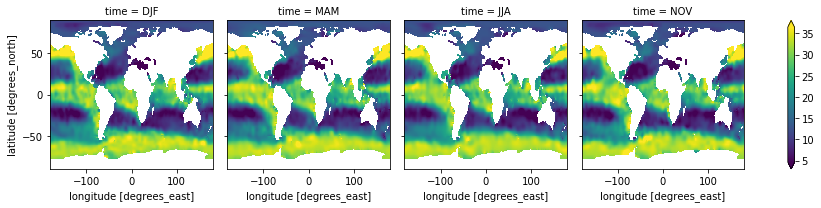

dissolved_oxygen at depth=300 m


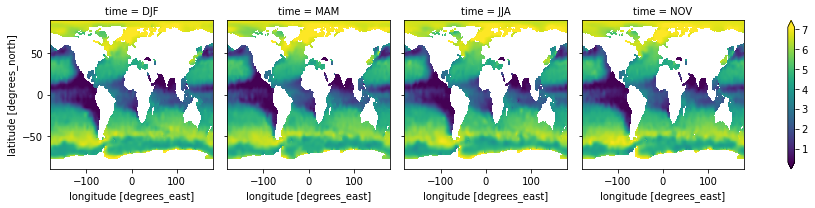

apparent_oxygen_utilization at depth=300 m


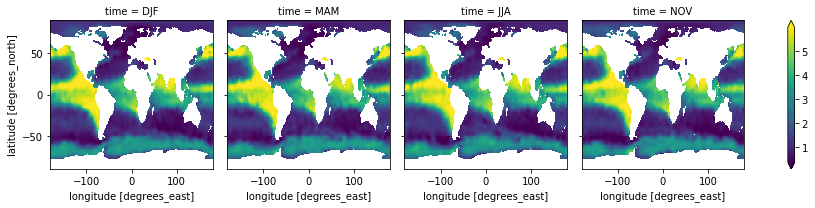

phosphate at depth=300 m


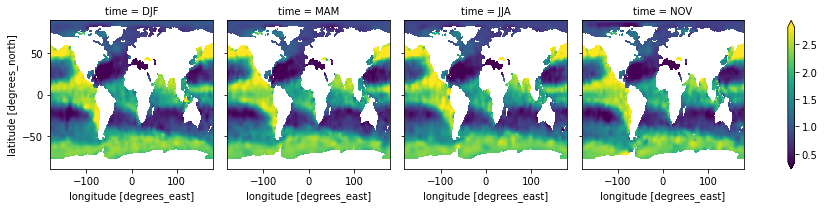

salinity at depth=300 m


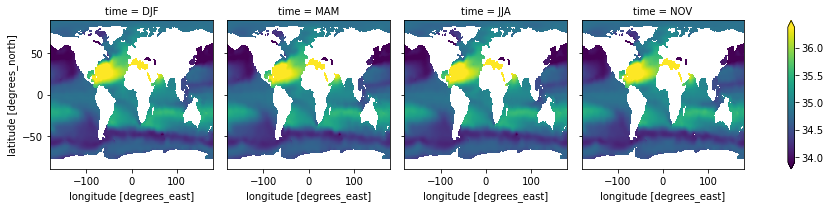

silicate at depth=300 m


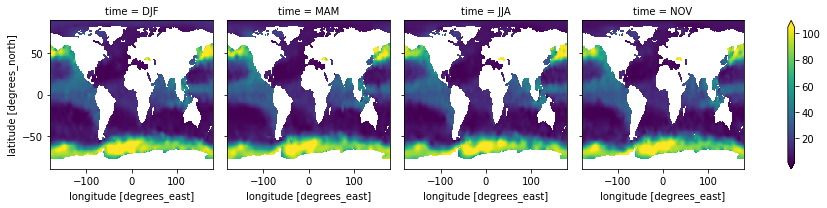

temperature at depth=300 m


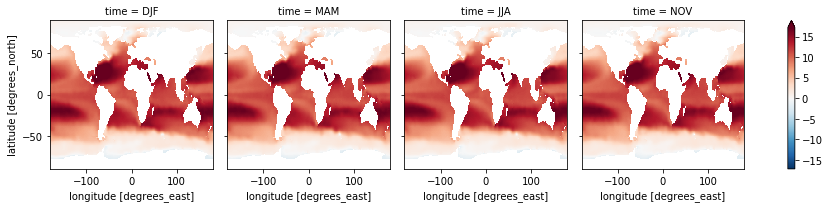

In [55]:
spatial_resolution='1deg'
temporal_resolution='seasonal'
seasons=['DJF','MAM','JJA','NOV']
depth=300
for varname in ['nitrate','dissolved_oxygen','apparent_oxygen_utilization','phosphate','salinity','silicate','temperature']:
    try:
        # load and plot the first variable in dataset
        s=cat.WOA13(s_res=spatial_resolution,t_res=temporal_resolution,var=varname).to_dask().to_array().isel(variable=0).squeeze()
        s['time']=seasons
        s.interp(depth=depth).plot(robust=True,yincrease=True,col='time')
        print(varname+' at depth='+str(depth)+' m')
        plt.show()
    except:
        print(varname,'not found')

## WOA13 seasonal nitrate

In [56]:
seasonal_nitrate=cat.WOA13(s_res='1deg',t_res='seasonal').to_dask()['n_an'].squeeze().sel(depth=15)
seasonal_nitrate['time']=seasons

In [57]:
seasonal_nitrate.hvplot(groupby='time',x='lon',y='lat')

:DynamicMap   [time]
   :Image   [lon,lat]   (n_an)

# Takahashi pCO$_2$
select grid resolution

In [18]:
months=['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec']

resolution: 1deg


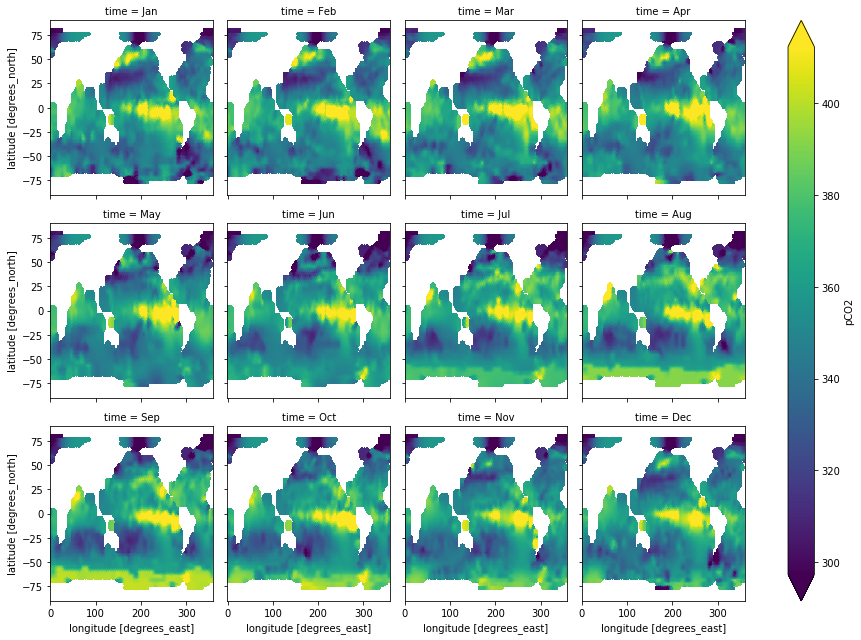

resolution: GR15


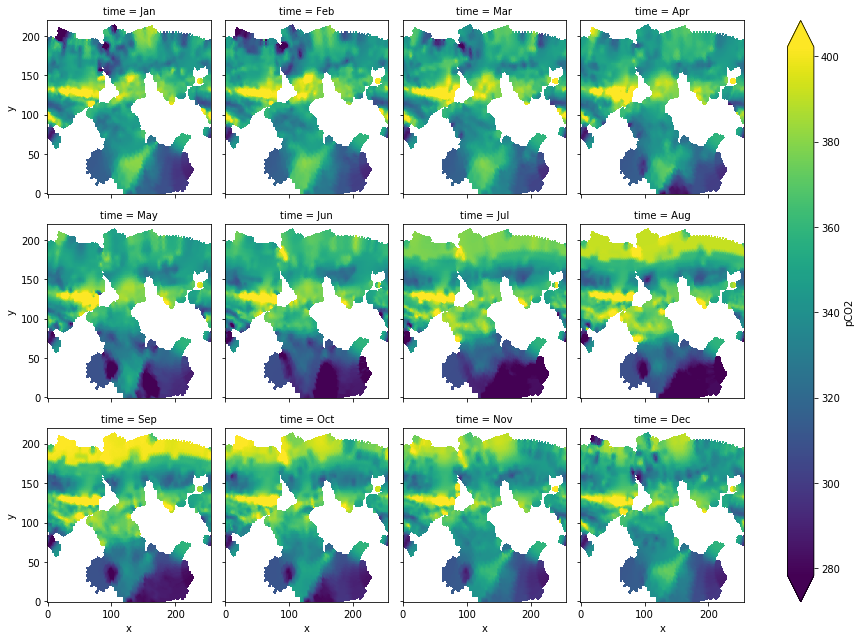

In [20]:
for resolution in ['1deg', 'GR15']:
    print('resolution:',resolution)
    s=cat.pco2_Takahashi(s_res=resolution).to_dask().rename({'var1':'pCO2'})['pCO2']
    s['time']=months
    s.plot(col='time',col_wrap=4,robust=True)
    plt.show()

# DUST Mahowald
select version and resolution

resolution GR15 size 2.7 MB


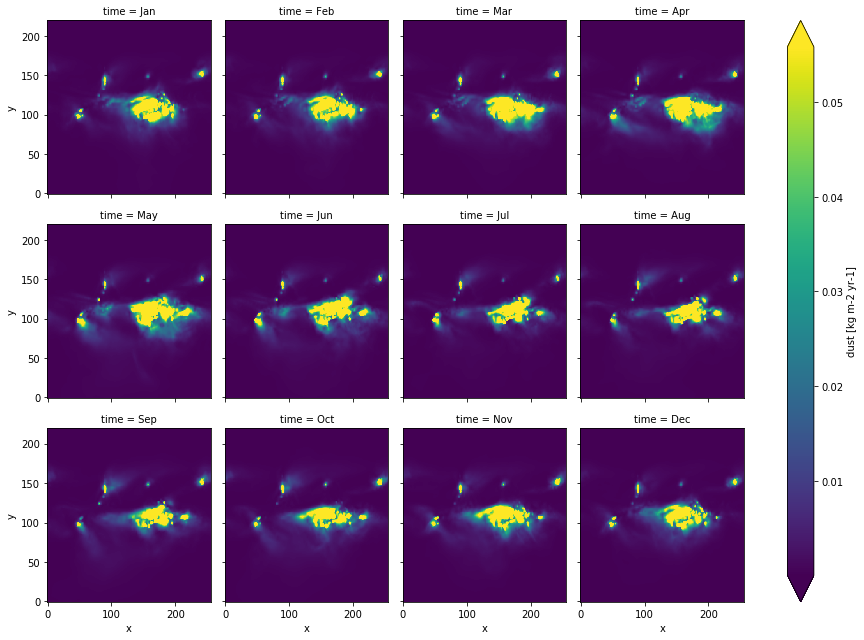

In [9]:
resolution='GR15'
version='r2'
s=cat.iron_Mahowald(s_res=resolution,version=version).to_dask()['DUST']
s['time']=months
print('resolution',resolution,'size',round(s.nbytes/1e6,2),'MB')
s.plot(col='time',col_wrap=4,robust=True)

# SOCOM

## SOM-FFN

In [129]:
somffn=cat['fgco2_SOMFFN'].to_dask()['fgco2'].squeeze()

/work/mh0727/m300524/anaconda3/envs/my_jupyter/lib/python3.6/site-packages/dask/array/numpy_compat.py:28: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)


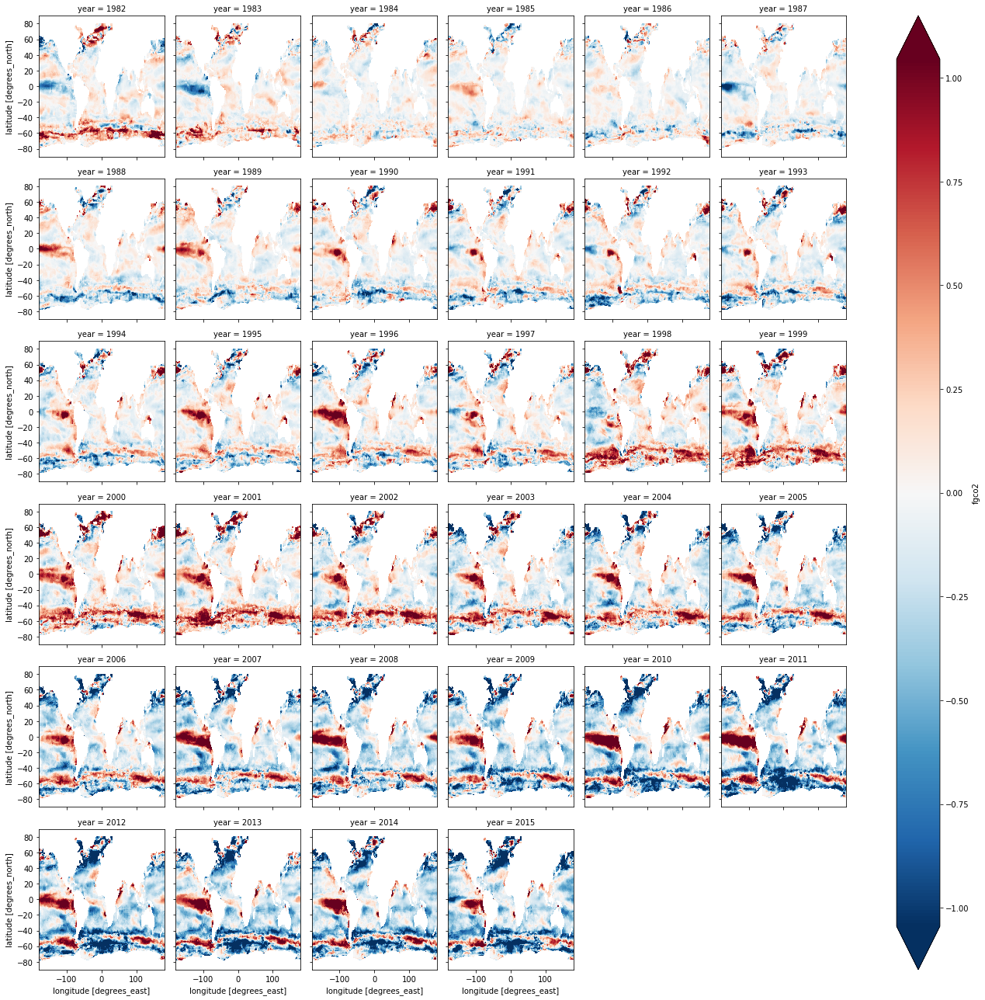

In [130]:
# plot annual anomalies wrt the 1980s
(somffn-somffn.sel(time=slice('1982','1989')).mean('time')).groupby('time.year').mean('time').plot(col='year',col_wrap=6,robust=True)

## Jena-MLS

In [67]:
fgco2_jensmls=cat.fgco2_JenaMLS().to_dask()['co2flux_ocean'].squeeze().rename({'mtime':'time'})

In [77]:
fgco2_jensmls_mm=fgco2_jensmls.resample(time='1M').sum('time').compute()

In [78]:
fgco2_jensmls_ym=fgco2_jensmls_mm.resample(time='1A').sum('time').compute()

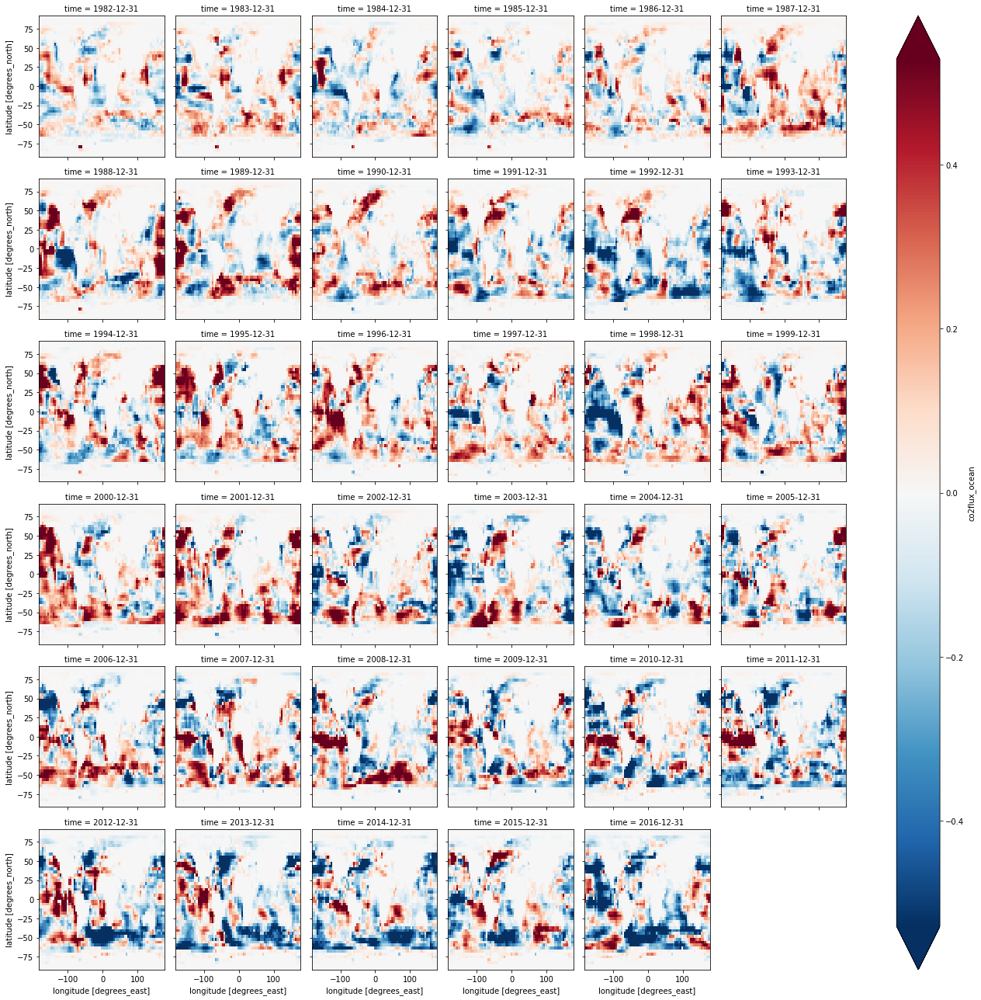

In [85]:
(fgco2_jensmls_ym-fgco2_jensmls_ym.mean('time')).plot(col='time',col_wrap=6,robust=True)

In [79]:
path='/work/mh0727/data/SOCOM/gridded_data/Jena-MLS/'

In [86]:
#fgco2_jensmls_mm.to_netcdf(path+'fgco2_mm.nc')

In [88]:
#fgco2_jensmls_ym.to_netcdf(path+'fgco2_ym.nc')

## biomes

In [91]:
biomes=pd.read_csv(cat.SOCOM_biomes.metadata['readme'],header=43,sep='\t',index_col=0)

In [92]:
varnames=pd.read_csv(cat.SOCOM_biomes.metadata['readme'],header=16,sep='\t',index_col=0).iloc[2:24]

In [93]:
varnames.index=varnames.index.str.replace('(taxis)','')
varnames.index=varnames.index.str.replace('(','')
varnames.index=varnames.index.str.replace(')','')

In [94]:
varnames

,Unit,Meaning
Variable,,
mmeanf,[uatm],monthly biome-mean pCO2 (gap-filled)
meanf,[uatm],yearly biome-mean pCO2 (gap-filled)
mpickf,[uatm],monthly selected biome-mean pCO2 (at SOCATv2 d...
pickf,[uatm],yearly selected biome-mean pCO2 (at SOCATv2 da...
mdataf,[uatm],monthly biome-mean SOCATv2 data
dataf,[uatm],yearly biome-mean SOCATv2 data
mbiasf,[uatm],monthly biome-mean difference of pCO2 field an...
biasf,[uatm],yearly biome-mean difference of pCO2 field and...
mfluxf,[PgC/yr],monthly biome-mean sea-air CO2 flux


In [95]:
biomes.tail()

,Abbreviation,Name
No.,,
13,SA STPS,South Atlantic Subtropical Permanently Stratified
14,IND STPS,Indian Ocean Subtropical Permanently Stratified
15,SO STSS,Southern Ocean Subtropical Seasonally Stratified
16,SO SPSS,Southern Ocean Subpolar Seasonally Stratified
17,SO ICE,Southern Ocean Ice


In [96]:
biome_index = 16

In [97]:
products=['ETH-SOMFFN','AOML-EMP','CARBONES-NN','CU-SCSE','Jena-MLS13','JMA-MLR','NIES-NN','NIES-OTTM','OceanFlux-SI','PU-MCMC','UEA-SI','UEx-MRL','UNSW-SOMLO']

ETH-SOMFFN
AOML-EMP
CARBONES-NN
CU-SCSE
Jena-MLS13
JMA-MLR
NIES-NN
NIES-OTTM
OceanFlux-SI
PU-MCMC
UEA-SI
UEx-MRL
UEx-MRL not found
UNSW-SOMLO


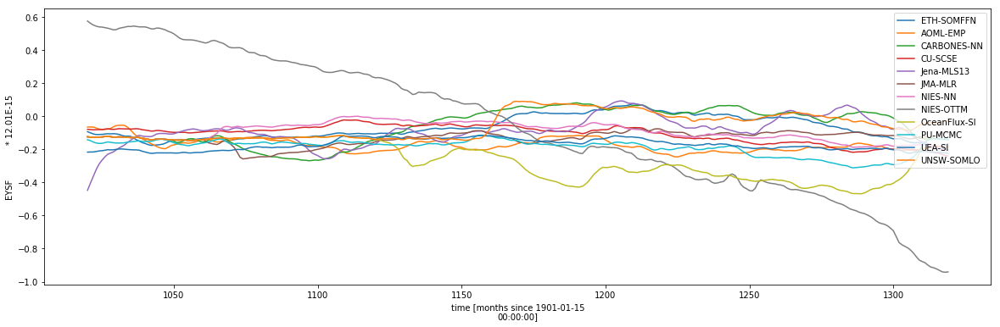

In [99]:
fig,ax = plt.subplots(figsize=(20,6))
for product in products:
    print(product)
    try:
        ds=cat.SOCOM_biomes(biome=biome_index,product=product).to_dask()['fluxf']
    except:
        print(product,'not found')
        continue
    ds.sel(taxis=slice(1020,1320)).plot(label=product)
plt.legend()

## Levitus MLD climatology

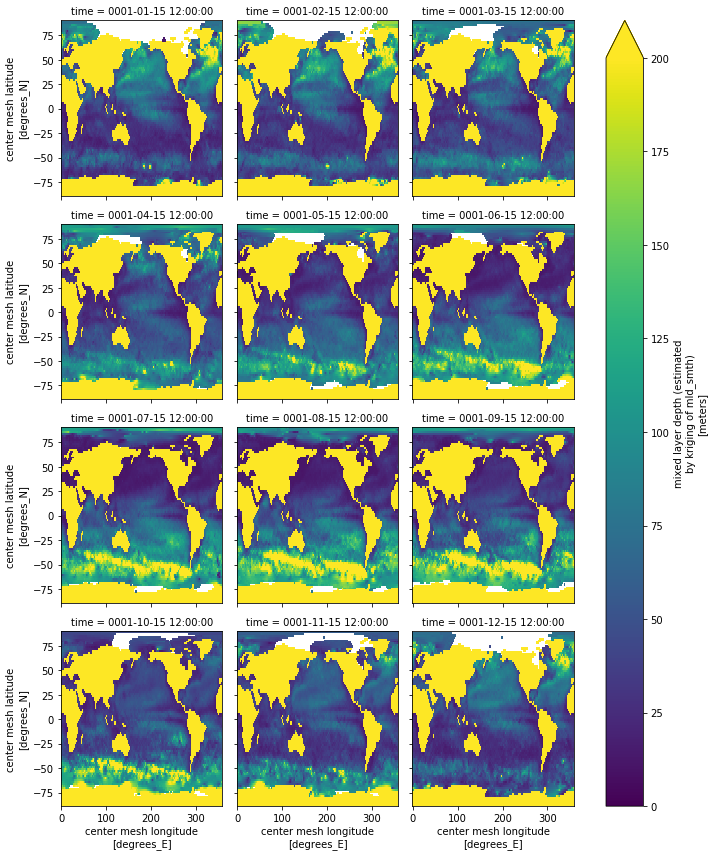

In [102]:
cat['zmld.IFREMER'].to_dask()['mld'].plot(col='time',col_wrap=3,vmin=0,vmax=200)